## 1 задание

Вам будет предоставлен датасет. В нем посчитано количество событий в группировке по:

url - адрес страницы,

event_name - название события,

product_category - категория продукта,

event_timestamp - время событий округленное до часу,

device_type - тип устройства

Необходимо будет придумать модель и написать код, который позволит найти отклонения во временном рядом. В задаче необходимо будет дать определение тому, что вы называете отклонением, придумать модель, которая будет осуществлять поиск таких отклонений. Это может быть сравнение нескольких моделей, для поиска наилучшей. Определить каким продуктам, устройствам или адресам страниц свойственны отклонения. Результатом работы должен быть код на Python. А так же презентация результатов самих моделей.

In [56]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.ensemble import IsolationForest
from sklearn.preprocessing import MinMaxScaler
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense

<IPython.core.display.Javascript object>

In [12]:
%load_ext nb_black

<IPython.core.display.Javascript object>

In [13]:
%config InlineBackend.figure_format='retina'

<IPython.core.display.Javascript object>

In [11]:
df = pd.read_csv(
    "anomaly_detection_v2.csv",
    parse_dates=["event_timestamp"]
)

In [14]:
df.shape

(6078205, 6)

<IPython.core.display.Javascript object>

In [15]:
df.isnull().sum()

event_name                 0
event_timestamp            0
device_type            93813
event_count                0
url_id                     0
product_category_id        0
dtype: int64

<IPython.core.display.Javascript object>

In [16]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6078205 entries, 0 to 6078204
Data columns (total 6 columns):
 #   Column               Dtype         
---  ------               -----         
 0   event_name           object        
 1   event_timestamp      datetime64[ns]
 2   device_type          object        
 3   event_count          int64         
 4   url_id               int64         
 5   product_category_id  int64         
dtypes: datetime64[ns](1), int64(3), object(2)
memory usage: 278.2+ MB


<IPython.core.display.Javascript object>

In [17]:
df.event_name.value_counts()

event_name
events.pageLoad        4692641
events.formAutosave     841813
events.formSubmit       543751
Name: count, dtype: int64

<IPython.core.display.Javascript object>

In [18]:
print(f"Уникалные события и их количество \n{df.event_name.value_counts()}")

Уникалные события и их количество 
event_name
events.pageLoad        4692641
events.formAutosave     841813
events.formSubmit       543751
Name: count, dtype: int64


<IPython.core.display.Javascript object>

In [19]:
print(f"Уникалные device_type и их количество \n{df.device_type.value_counts()}")
print()
print(f"Пустых значений в device_type - {df.device_type.isnull().sum()}")

Уникалные device_type и их количество 
device_type
HIGHEND_PHONE        3526683
PERSONAL_COMPUTER    2097919
TABLET                320877
BOT                    17911
CONNECTED_TV            9992
SET_TOP_BOX             8169
CONNECTED_DEVICE        2839
UNKNOWN                    2
Name: count, dtype: int64

Пустых значений в device_type - 93813


<IPython.core.display.Javascript object>

In [20]:
print(f"Уникалные url_id и их количество \n{df.url_id.value_counts()}")

Уникалные url_id и их количество 
url_id
175       23342
259       22002
109       21932
446       20543
211       19886
          ...  
339431        1
339430        1
339428        1
339427        1
406357        1
Name: count, Length: 406460, dtype: int64


<IPython.core.display.Javascript object>

### Разделим dataframe по event_name 

In [22]:
df_event_name_pageLoad = df.query('event_name == "events.pageLoad"')
df_event_name_formAutosave = df.query('event_name == "events.formAutosave"')
df_event_name_formSubmit = df.query('event_name == "events.formSubmit"')

<IPython.core.display.Javascript object>

### Поработаем с pageLoad

In [36]:
pageLoad_series = df_event_name_pageLoad.groupby("event_timestamp", as_index=False).agg(
    event_count=("event_count", "sum")
)

<IPython.core.display.Javascript object>

Проверим, есть ли пропущенные часы

In [54]:
pageLoad_series.shape

(2208, 2)

<IPython.core.display.Javascript object>

In [51]:
(
    pd.to_datetime(pageLoad_series.event_timestamp.max())
    - pd.to_datetime(pageLoad_series.event_timestamp.min())
).total_seconds() / 3600

2207.0

<IPython.core.display.Javascript object>

Пропущенных часов нет

In [57]:
pageLoad_series.head()

,event_timestamp,event_count
0,2023-07-31 21:00:00,28908
1,2023-07-31 22:00:00,19806
2,2023-07-31 23:00:00,15913
3,2023-08-01 00:00:00,15554
4,2023-08-01 01:00:00,15905


<IPython.core.display.Javascript object>

In [58]:
data = pd.read_csv("anomaly_detection_v2.csv")
data["event_timestamp"] = pd.to_datetime(data["event_timestamp"])
data = data.groupby(["event_timestamp"]).size().reset_index(name="event_count")
data = data.rename(columns={"event_timestamp": "ds", "event_count": "y"})

<IPython.core.display.Javascript object>

In [59]:
data

,ds,y
0,2023-07-31 21:00:00,2083
1,2023-07-31 22:00:00,1785
2,2023-07-31 23:00:00,1587
3,2023-08-01 00:00:00,1509
4,2023-08-01 01:00:00,1539
...,...,...
2203,2023-10-31 16:00:00,3874
2204,2023-10-31 17:00:00,3799
2205,2023-10-31 18:00:00,3646
2206,2023-10-31 19:00:00,3444


<IPython.core.display.Javascript object>

Epoch 1/50
55/55 [==============================] - 1s 6ms/step - loss: 0.0496 - val_loss: 0.0317
Epoch 2/50
55/55 [==============================] - 0s 2ms/step - loss: 0.0172 - val_loss: 0.0268
Epoch 3/50
55/55 [==============================] - 0s 3ms/step - loss: 0.0136 - val_loss: 0.0222
Epoch 4/50
55/55 [==============================] - 0s 3ms/step - loss: 0.0080 - val_loss: 0.0137
Epoch 5/50
55/55 [==============================] - 0s 3ms/step - loss: 0.0047 - val_loss: 0.0104
Epoch 6/50
55/55 [==============================] - 0s 3ms/step - loss: 0.0043 - val_loss: 0.0111
Epoch 7/50
55/55 [==============================] - 0s 3ms/step - loss: 0.0039 - val_loss: 0.0116
Epoch 8/50
55/55 [==============================] - 0s 3ms/step - loss: 0.0036 - val_loss: 0.0089
Epoch 9/50
55/55 [==============================] - 0s 3ms/step - loss: 0.0034 - val_loss: 0.0086
Epoch 10/50
55/55 [==============================] - 0s 3ms/step - loss: 0.0032 - val_loss: 0.0100
Epoch 11/50
55/55 [

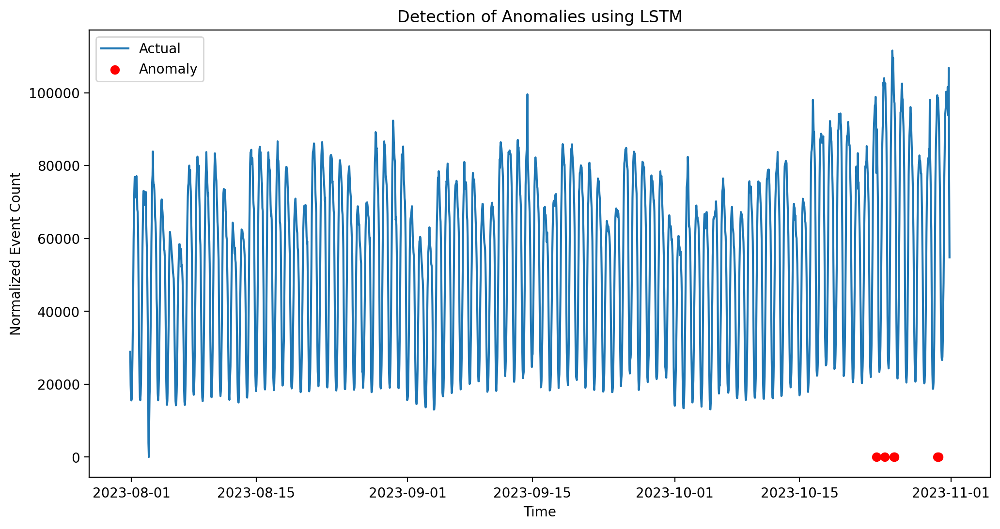

Обнаружено аномалий: 6
Список аномальных дат: 2010   2023-10-23 15:00:00
2032   2023-10-24 13:00:00
2057   2023-10-25 14:00:00
2058   2023-10-25 15:00:00
2175   2023-10-30 12:00:00
2177   2023-10-30 14:00:00
Name: ds, dtype: datetime64[ns]


<IPython.core.display.Javascript object>

In [61]:
# Нормализация данных
scaler = MinMaxScaler(feature_range=(0, 1))
data["y"] = scaler.fit_transform(data["y"].values.reshape(-1, 1))


# Преобразование данных в форму, подходящую для LSTM
def create_sequences(data, sequence_length):
    sequences, targets = [], []
    for i in range(len(data) - sequence_length):
        sequences.append(data[i : i + sequence_length])
        targets.append(data[i + sequence_length])
    return np.array(sequences), np.array(targets)


sequence_length = 10  # Выберите подходящую длину последовательности
X, y = create_sequences(data["y"].values, sequence_length)

# Разделение данных на обучающую и тестовую выборки
train_size = int(len(X) * 0.8)
X_train, X_test = X[:train_size], X[train_size:]
y_train, y_test = y[:train_size], y[train_size:]

# Создание и обучение модели LSTM
model = Sequential()
model.add(LSTM(units=50, input_shape=(X_train.shape[1], 1)))
model.add(Dense(units=1))
model.compile(optimizer="adam", loss="mean_squared_error")
model.fit(
    X_train,
    y_train,
    epochs=50,
    batch_size=32,
    validation_data=(X_test, y_test),
    verbose=1,
)

# Получение предсказаний
predictions = model.predict(X_test)

# Распределение ошибок предсказания
errors = np.abs(predictions.reshape(-1) - y_test)

# Установка порога для выявления аномалий
threshold = 0.1  # Выберите подходящий порог

# Идентификация отклонений
anomalies = data.iloc[train_size + sequence_length :][errors > threshold]

# Визуализация результатов
plt.figure(figsize=(12, 6))
plt.plot(
    pageLoad_series["event_timestamp"], pageLoad_series["event_count"], label="Actual"
)
plt.scatter(anomalies["ds"], anomalies["y"], color="red", label="Anomaly")
plt.title("Detection of Anomalies using LSTM")
plt.xlabel("Time")
plt.ylabel("Normalized Event Count")
plt.legend()
plt.show()

# Вывод результатов
print("Обнаружено аномалий:", anomalies.shape[0])
print("Список аномальных дат:", anomalies["ds"])

In [71]:
pageLoad_series.tail(60)

,event_timestamp,event_count
2148,2023-10-29 09:00:00,79131
2149,2023-10-29 10:00:00,81875
2150,2023-10-29 11:00:00,82082
2151,2023-10-29 12:00:00,81112
2152,2023-10-29 13:00:00,84511
2153,2023-10-29 14:00:00,83609
2154,2023-10-29 15:00:00,98068
2155,2023-10-29 16:00:00,82310
2156,2023-10-29 17:00:00,77054
2157,2023-10-29 18:00:00,69966


<IPython.core.display.Javascript object>

In [67]:
import plotly.express as px

fig = px.line(
    pageLoad_series,
    x="event_timestamp",
    y="event_count",
    title="Life expectancy in Canada",
)
fig.show()

<IPython.core.display.Javascript object>

In [74]:
fig, ax = plt.subplots(figsize=(200, 50), dpi=100)
plt.plot(pageLoad_series.event_timestamp, pageLoad_series.event_count)
plt.grid()
plt.show()

<IPython.core.display.Javascript object>

In [60]:
pageLoad_series.head()

,event_timestamp,event_count
0,2023-07-31 21:00:00,28908
1,2023-07-31 22:00:00,19806
2,2023-07-31 23:00:00,15913
3,2023-08-01 00:00:00,15554
4,2023-08-01 01:00:00,15905


<IPython.core.display.Javascript object>

In [52]:
pageLoad_series

,event_timestamp,event_count
0,2023-07-31 21:00:00,28908
1,2023-07-31 22:00:00,19806
2,2023-07-31 23:00:00,15913
3,2023-08-01 00:00:00,15554
4,2023-08-01 01:00:00,15905
...,...,...
2203,2023-10-31 16:00:00,100945
2204,2023-10-31 17:00:00,93757
2205,2023-10-31 18:00:00,106825
2206,2023-10-31 19:00:00,76739


<IPython.core.display.Javascript object>

In [34]:
91 * 24 + 23

2207

<IPython.core.display.Javascript object>

In [ ]:
data = data.resample('1D').sum().fillna(0)

In [25]:
df_event_name_pageLoad

,event_name,event_timestamp,device_type,event_count,url_id,product_category_id
0,events.pageLoad,2023-10-28 08:00:00,HIGHEND_PHONE,1,0,0
1,events.pageLoad,2023-10-04 06:00:00,HIGHEND_PHONE,44,0,0
2,events.pageLoad,2023-10-03 10:00:00,HIGHEND_PHONE,47,0,0
3,events.pageLoad,2023-10-03 08:00:00,HIGHEND_PHONE,55,0,0
4,events.pageLoad,2023-10-05 03:00:00,PERSONAL_COMPUTER,1,0,0
...,...,...,...,...,...,...
6078200,events.pageLoad,2023-10-09 10:00:00,PERSONAL_COMPUTER,1,399650,6
6078201,events.pageLoad,2023-08-23 12:00:00,PERSONAL_COMPUTER,1,400018,6
6078202,events.pageLoad,2023-09-01 17:00:00,HIGHEND_PHONE,1,400018,6
6078203,events.pageLoad,2023-09-11 17:00:00,HIGHEND_PHONE,1,403822,6


<IPython.core.display.Javascript object>

In [9]:
df_event_name_pageLoad

NameError: name 'df_event_name_pageLoad' is not defined

In [5]:
data = pd.read_csv('anomaly_detection_v2.csv')
data['event_timestamp'] = pd.to_datetime(data['event_timestamp'])

In [10]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6078205 entries, 0 to 6078204
Data columns (total 6 columns):
 #   Column               Dtype         
---  ------               -----         
 0   event_name           object        
 1   event_timestamp      datetime64[ns]
 2   device_type          object        
 3   event_count          int64         
 4   url_id               int64         
 5   product_category_id  int64         
dtypes: datetime64[ns](1), int64(3), object(2)
memory usage: 278.2+ MB


In [8]:
data.groupby(['event_timestamp']).size().reset_index(name='event_count')

,event_timestamp,event_count
0,2023-07-31 21:00:00,2083
1,2023-07-31 22:00:00,1785
2,2023-07-31 23:00:00,1587
3,2023-08-01 00:00:00,1509
4,2023-08-01 01:00:00,1539
...,...,...
2203,2023-10-31 16:00:00,3874
2204,2023-10-31 17:00:00,3799
2205,2023-10-31 18:00:00,3646
2206,2023-10-31 19:00:00,3444


In [ ]:
data = data.rename(columns={'event_timestamp': 'ds', 'event_count': 'y'})